$$\Large\textbf{Multinomal Naive Bayes for Human-Machine Text Classfication}$$

# Imports

In [2]:
# standard imports
import json
import re

# installed imports
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import nltk
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils import resample

# download nltk stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\helen\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

# 1. Data Preparation
## 1.1. Data Loading

In [4]:
def load_jsonl(file_path):
    """
    Load a JSONL file and return a pandas DataFrame.

    Args:
        file_path (str): The path to the JSONL file to be loaded.

    Returns:
        pd.DataFrame: DataFrame containing the JSONL file's data.
    """
    with open(file_path, 'r') as file:
        # read each line in the jsonl file and load as json, then add to a list
        data = [json.loads(line) for line in file]
    # convert list of json objects to pandas dataframe
    return pd.DataFrame(data)

## 1.2. Data Preprocessing

In [5]:
def preprocess_text(text):
    """
    Clean and standardize the text data.

    The preprocessing includes converting to lowercase, removing punctuation, removing numbers,
    removing non English alphabet chars, and removing stopwords and single letter words.

    Args:
        text (str): The input text to be cleaned.

    Returns:
        str: The cleaned and preprocessed text.
    """
    stop_words = set(stopwords.words('english'))
    
    text = text.lower()  # convert text to lowercase
    text = text.replace('\n', ' ')  # remove newline characters
    text = re.sub(r'[^\w\s]', ' ', text)  # replace all punctuation with a space
    text = re.sub(r'\d+', ' ', text)  # remove all numbers
    text = re.sub(r'[^a-z\s]', ' ', text)  # retain only English alphabet characters and whitespace
    text = re.sub(r'\s+', ' ', text).strip()  # remove extra spaces
    text = ' '.join([word for word in text.split() if word not in stop_words and len(word) > 1])  # remove stopwords and unique chars
    
    return text

## 1.3. Train and Test Set Creation

### 1.3.1. Load jsonl Files

In [5]:
pd.options.display.max_columns = None  # show all columns without truncation
pd.options.display.max_colwidth = 200  # increase the width of text columns to avoid truncation

In [6]:
# load the train dataset
train_file_path = r"C:\Users\helen\Documents\Concordia University\fall 2024\COMP 6781 - Statistical NLP\code\project-local\data\en_train.jsonl"
train_df = load_jsonl(train_file_path)


In [6]:
# load the test dataset
test_file_path = r"C:\Users\helen\Documents\Concordia University\fall 2024\COMP 6781 - Statistical NLP\code\project-local\data\test_set_en_with_label.jsonl"
test_df = load_jsonl(test_file_path)


In [8]:
train_df.head()

,id,source,sub_source,lang,model,label,text
0,f05034ca-d1da-445d-a6a2-5869ade0dfc3,m4gt,reddit,en,llama3-8b,1,"Hitler's plans for the succession and power structure after his death are shrouded in mystery, as he never explicitly wrote down his intentions. However, it is known that he designated several pot..."
1,e7d7fe23-3709-4e14-aa2d-d76821dcbdf6,mage,squad,en,human,0,"The Bush administration then turned its attention to Iraq, and argued the need to remove Saddam Hussein from power in Iraq had become urgent. Among the stated reasons were that Saddam's regime had..."
2,1a68d42e-4202-4e36-bceb-02d693440a14,mage,yelp,en,human,0,Really really the best pedi ever! Pho was so attentive and didn't rush me at all! Every time I come to Vegas I am coming here!
3,5de844ab-c197-4378-b144-c3a46e3f5b67,mage,xsum,en,human,0,"The PS42m MV Loch Seaforth made its first passenger sailing last month but is still in a ""test period"" and not fully in service. Thursday's fault took five hours to fix and the ferry was cleared a..."
4,cdf050ad-7d90-4235-b7c6-46ca6cfc4382,m4gt,wikipedia,en,human,0,"Malta participated in the Eurovision Song Contest 2005 with the song ""Angel"" written and performed by Chiara, who had previously represented Malta at the Eurovision Song Contest in the 1998 editio..."


In [9]:
test_df.head()

,text,language,label,source,model,prompt_flag,prompt,domain,paper_id,binary,mixset_category,testset_id
0,"Hello, Thanks for sharing your health concern with us. I have gone through your query and here are your answers: 1. If you have regular cycles, there is no further need to use any medication to re...",English,0,CUDRT,human,NA,hello Dr. ! I am married since 2 years and my age is 30 years. My period was delayed for 3 Months in Jan 2017. so Dr. suggested me to take Reg flaw for 3 months and then try to conceive. but I did...,GPT3.5_QA,None,None,None,0
1,"In primary school, especially in the countryside in Japan, primary students have an opportunity to learn how to plant and grow vegetables. In addition, students need to feed and observe animal gro...",English,0,ieltsduck,human,NA,NA,ielts,None,None,None,1
2,The advent of artificial intelligence (AI) has sparked a vigorous debate about the future of work and the potential of robots to take over jobs traditionally performed by humans. While I acknowled...,English,1,ieltsduck,gpt-4o-mini-2024-07-18,improved,"Please act as a student preparing for the IELTS exam. Write a well-structured essay that responds to the question, mimicking the style, language, and approach of a genuine IELTS student.",ielts,None,None,None,2
3,Unemployment insurance through options refers to the use of financial options as a form of insurance against the risk of unemployment. One way this can be done is through the use of put options. A...,English,1,CUDRT,GPT3.5,NA,Unemployment Insurance Through Options,GPT3.5_QA,None,None,None,3
4,The long exposure feature on DSLR cameras works by allowing the camera to take a picture for a longer period of time than usual. This is especially useful for taking pictures of the night sky beca...,English,1,CUDRT,ChatGLM,NA,"How the long exposure feature on DSLR Cameras work . More specifically , how do the cameras capture pictures of the night sky ? How long does the camera need to "" take "" the picture ? Explain like...",ChatGLM_QA,None,None,None,4


### 1.3.2. Only Keep Label and Text Columns

In [10]:
# retain only relevant columns
train_df = train_df[['text', 'label']]
test_df = test_df[['text', 'label']]

In [11]:
train_df.head()

,text,label
0,"Hitler's plans for the succession and power structure after his death are shrouded in mystery, as he never explicitly wrote down his intentions. However, it is known that he designated several pot...",1
1,"The Bush administration then turned its attention to Iraq, and argued the need to remove Saddam Hussein from power in Iraq had become urgent. Among the stated reasons were that Saddam's regime had...",0
2,Really really the best pedi ever! Pho was so attentive and didn't rush me at all! Every time I come to Vegas I am coming here!,0
3,"The PS42m MV Loch Seaforth made its first passenger sailing last month but is still in a ""test period"" and not fully in service. Thursday's fault took five hours to fix and the ferry was cleared a...",0
4,"Malta participated in the Eurovision Song Contest 2005 with the song ""Angel"" written and performed by Chiara, who had previously represented Malta at the Eurovision Song Contest in the 1998 editio...",0


In [12]:
test_df.head()

,text,label
0,"Hello, Thanks for sharing your health concern with us. I have gone through your query and here are your answers: 1. If you have regular cycles, there is no further need to use any medication to re...",0
1,"In primary school, especially in the countryside in Japan, primary students have an opportunity to learn how to plant and grow vegetables. In addition, students need to feed and observe animal gro...",0
2,The advent of artificial intelligence (AI) has sparked a vigorous debate about the future of work and the potential of robots to take over jobs traditionally performed by humans. While I acknowled...,1
3,Unemployment insurance through options refers to the use of financial options as a form of insurance against the risk of unemployment. One way this can be done is through the use of put options. A...,1
4,The long exposure feature on DSLR cameras works by allowing the camera to take a picture for a longer period of time than usual. This is especially useful for taking pictures of the night sky beca...,1


### 1.3.3. Text Preprocessing

In [13]:
# apply text preprocessing to the 'text' column
train_df['cleaned_text'] = train_df['text'].apply(preprocess_text)
test_df['cleaned_text'] = test_df['text'].apply(preprocess_text)

In [14]:
train_df.head()

,text,label,cleaned_text
0,"Hitler's plans for the succession and power structure after his death are shrouded in mystery, as he never explicitly wrote down his intentions. However, it is known that he designated several pot...",1,hitler plans succession power structure death shrouded mystery never explicitly wrote intentions however known designated several potential successors including heinrich himmler hermann ring josep...
1,"The Bush administration then turned its attention to Iraq, and argued the need to remove Saddam Hussein from power in Iraq had become urgent. Among the stated reasons were that Saddam's regime had...",0,bush administration turned attention iraq argued need remove saddam hussein power iraq become urgent among stated reasons saddam regime tried acquire nuclear material properly accounted biological...
2,Really really the best pedi ever! Pho was so attentive and didn't rush me at all! Every time I come to Vegas I am coming here!,0,really really best pedi ever pho attentive rush every time come vegas coming
3,"The PS42m MV Loch Seaforth made its first passenger sailing last month but is still in a ""test period"" and not fully in service. Thursday's fault took five hours to fix and the ferry was cleared a...",0,ps mv loch seaforth made first passenger sailing last month still test period fully service thursday fault took five hours fix ferry cleared sailings another ferry isle lewis took passengers invol...
4,"Malta participated in the Eurovision Song Contest 2005 with the song ""Angel"" written and performed by Chiara, who had previously represented Malta at the Eurovision Song Contest in the 1998 editio...",0,malta participated eurovision song contest song angel written performed chiara previously represented malta eurovision song contest edition achieved ninth place song one love maltese entry contest...


In [15]:
test_df.head()

,text,label,cleaned_text
0,"Hello, Thanks for sharing your health concern with us. I have gone through your query and here are your answers: 1. If you have regular cycles, there is no further need to use any medication to re...",0,hello thanks sharing health concern us gone query answers regular cycles need use medication regulate cycles establishment regular ovulation timing intercourse properly necessary want conceive qui...
1,"In primary school, especially in the countryside in Japan, primary students have an opportunity to learn how to plant and grow vegetables. In addition, students need to feed and observe animal gro...",0,primary school especially countryside japan primary students opportunity learn plant grow vegetables addition students need feed observe animal growth health great advantage children enrich knowle...
2,The advent of artificial intelligence (AI) has sparked a vigorous debate about the future of work and the potential of robots to take over jobs traditionally performed by humans. While I acknowled...,1,advent artificial intelligence ai sparked vigorous debate future work potential robots take jobs traditionally performed humans acknowledge ai indeed transform workplace believe complete replaceme...
3,Unemployment insurance through options refers to the use of financial options as a form of insurance against the risk of unemployment. One way this can be done is through the use of put options. A...,1,unemployment insurance options refers use financial options form insurance risk unemployment one way done use put options put option gives holder right obligation sell specific asset predetermined...
4,The long exposure feature on DSLR cameras works by allowing the camera to take a picture for a longer period of time than usual. This is especially useful for taking pictures of the night sky beca...,1,long exposure feature dslr cameras works allowing camera take picture longer period time usual especially useful taking pictures night sky allows camera capture light capture picture night sky usi...


### 1.3.4. Separate Feature (text) from Target (label)

In [16]:
# separate features and labels
X_train = train_df['cleaned_text']
y_train = train_df['label']
X_test = test_df['cleaned_text']
y_test = test_df['label']

In [17]:
X_train[:3]

0    hitler plans succession power structure death shrouded mystery never explicitly wrote intentions however known designated several potential successors including heinrich himmler hermann ring josep...
1    bush administration turned attention iraq argued need remove saddam hussein power iraq become urgent among stated reasons saddam regime tried acquire nuclear material properly accounted biological...
2                                                                                                                               really really best pedi ever pho attentive rush every time come vegas coming
Name: cleaned_text, dtype: object

In [18]:
type(X_test)

pandas.core.series.Series

### 1.3.5. Data Visualisation

In [20]:
def show_label_distribution(df: pd.DataFrame, column_name: str):
    """Display a histogram to show the distribution of the label_column_name in the given DataFrame.
    
    Args:
        df: The DataFrame containing the 'Label' column.
        column_name: The name of the column to show the distribution
    """
    # Create the histogram
    plt.hist(df[column_name],
             bins=np.arange(len(df[column_name].unique()) + 1) - 0.5,
             rwidth=0.8,
             color='skyblue')  # Adjust the number of bins and color as needed

    # Label the axes and add a title
    plt.xlabel(column_name)
    plt.ylabel('Frequency')
    plt.title(f"The Distribution of the {column_name}")
    plt.xticks(rotation=90)

    # Display the histogram
    plt.show()

    print(df[column_name].value_counts())

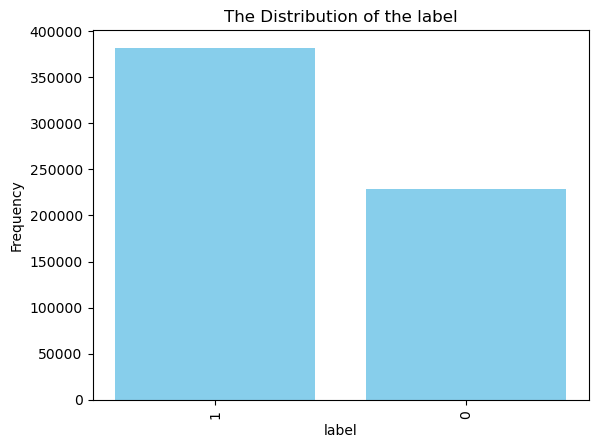

label
1    381845
0    228922
Name: count, dtype: int64


In [28]:
show_label_distribution(pd.DataFrame(train_df["label"].apply(str)), "label")

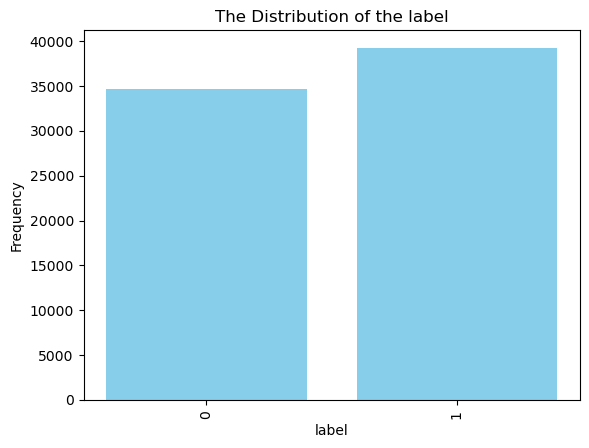

label
1    39266
0    34675
Name: count, dtype: int64


In [30]:
show_label_distribution(pd.DataFrame(test_df["label"].apply(str)), "label")

# 2. TF-IDF Vectorization
## 2.1. Vocabulary Analysis

In [19]:
def vocab_frequency(text):
    """Create a dictionary of word frequencies from a given text string.

    Args:
        text (str): A single string containing the entire dataset's text, where all individual texts are joined together.

    Returns:
        dict: A dictionary where each key is a word and its corresponding value is the frequency of that word in the text.
    """
    vocab_dict = {}  # initialize an empty dictionary to store word frequencies

    words = text.split()  # split the text into individual words

    # count the frequency of each word
    for word in words:
        if word in vocab_dict:
            vocab_dict[word] += 1  # increment the count if the word is already in the dictionary
        else:
            vocab_dict[word] = 1   # add new word with a count of 1 if it's not in the dictionary

    return vocab_dict

In [20]:
# join all cleaned text in the training set into one large string
train_all_text = " ".join(X_train)  # concatenate all texts into a single string
vocab_freq_dict = vocab_frequency(train_all_text)

In [21]:
print(f"total vocab length: {len(vocab_freq_dict)}")

total vocab length: 507334


In [22]:
print(vocab_freq_dict)

{'hitler': 3366, 'plans': 12883, 'succession': 1207, 'power': 61448, 'structure': 33772, 'death': 27690, 'shrouded': 393, 'mystery': 2958, 'never': 60111, 'explicitly': 2469, 'wrote': 9753, 'intentions': 1574, 'however': 124849, 'known': 69690, 'designated': 4531, 'several': 75098, 'potential': 88236, 'successors': 336, 'including': 97152, 'heinrich': 395, 'himmler': 72, 'hermann': 262, 'ring': 8876, 'joseph': 3837, 'goebbels': 146, 'strengths': 12575, 'weaknesses': 10228, 'final': 22628, 'days': 35596, 'life': 106358, 'grew': 6968, 'increasingly': 7344, 'paranoid': 458, 'isolated': 3340, 'leading': 29562, 'rumors': 1205, 'civil': 10689, 'war': 48441, 'within': 55087, 'nazi': 2978, 'party': 33831, 'became': 33604, 'convinced': 2045, 'plotting': 357, 'trusted': 3407, 'advisors': 1478, 'goering': 19, 'secretly': 739, 'vying': 189, 'counter': 8210, 'perceived': 3400, 'threat': 6190, 'reportedly': 1707, 'planned': 5281, 'appoint': 476, 'successor': 1295, 'likely': 44934, 'fuhrer': 30, 'pro

### 2.1.1. Check if the Stopword Lists from NLTK and TfidfVectorizer are Identical

In [23]:
# load NLTK stop words
nltk_stop_words = set(stopwords.words('english'))

# load the stop words used by TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')
sklearn_stop_words = set(vectorizer.get_stop_words())

# check if the two sets of stop words are identical
if nltk_stop_words == sklearn_stop_words:
    print("the stop words lists are the same")
else:
    print("the stop words lists are different")
    # find the difference in stop words
    nltk_unique = nltk_stop_words - sklearn_stop_words
    sklearn_unique = sklearn_stop_words - nltk_stop_words
    print(f"words in NLTK but not in scikit-learn: {nltk_unique}")
    print(f"words in scikit-learn but not in NLTK: {sklearn_unique}")


the stop words lists are different
words in NLTK but not in scikit-learn: {'didn', "needn't", 'does', 'doing', "wouldn't", 'having', 'hadn', 'isn', 'haven', 've', "won't", 'shouldn', 'weren', "wasn't", 'mustn', "mightn't", 'ma', 'hasn', "aren't", 'needn', 'shan', "don't", 'o', "weren't", 'wasn', 't', 'theirs', "you've", 'ain', 'don', 'mightn', "hadn't", 'couldn', "you'll", "doesn't", "you'd", "that'll", 'just', "shouldn't", 'doesn', 'wouldn', "couldn't", "you're", "shan't", 'won', "it's", 'll', "isn't", 'm', 'y', "hasn't", "should've", "haven't", "she's", "didn't", 'aren', "mustn't", 'd', 'did', 's'}
words in scikit-learn but not in NLTK: {'somehow', 'empty', 'three', 'around', 'amoungst', 'except', 'third', 'top', 'give', 'amount', 'ie', 'somewhere', 'serious', 'enough', 'thereby', 'much', 'would', 'thru', 'whereas', 'either', 'beforehand', 'another', 'become', 'due', 'must', 'keep', 'cry', 'first', 'last', 'hereby', 'whose', 'thence', 'one', 'two', 'seeming', 'anything', 'sixty', 'in

In [24]:
print(f"nltk stopwords length: {len(nltk_stop_words)}")
print(f"sklearn stopwords length: {len(sklearn_stop_words)}")

nltk stopwords length: 179
sklearn stopwords length: 318


## 2.2. TF-IDF Weighted Feature Vectors

In [32]:
def vectorize_text(train_texts, test_texts, max_features):
    """
    Transforms text data into TF-IDF weighted feature vectors without additional preprocessing.
    
    Args:
        train_texts (pandas.Series or list of str): Text data for the training set.
        test_texts (pandas.Series or list of str): Text data for the test set.
        max_features (int or None, optional): The maximum number of features (vocabulary size) for the 
                                              TF-IDF vectorizer. If None, all terms in the vocabulary are used.

    Returns:
        tuple: A tuple containing:
            - X_train_tfidf (sparse matrix): TF-IDF transformed training text data.
            - X_test_tfidf (sparse matrix): TF-IDF transformed test text data.
            - tfidf_vectorizer (TfidfVectorizer): Fitted TF-IDF vectorizer object, which contains the vocabulary 
                                                  and IDF values.
    """
    # initialize the TfidfVectorizer with custom settings to disable additional preprocessing
    tfidf_vectorizer = TfidfVectorizer(
        max_features=max_features,   # set maximum features for vocabulary size
        preprocessor=None,           # disable any built-in preprocessing
        tokenizer=None,              # use default tokenization (split on whitespace)
        stop_words=None,             # disable stop word removal (it's already done in the preprocessing)
        lowercase=False              # do not convert text to lowercase (it's already done in the preprocessing)
    )

    # fit the vectorizer on the training data and transform the training data
    X_train_tfidf = tfidf_vectorizer.fit_transform(train_texts)

    # transform the test data using the fitted vectorizer
    X_test_tfidf = tfidf_vectorizer.transform(test_texts)

    # check shapes
    print("TF-IDF training set shape:", X_train_tfidf.shape)
    print("TF-IDF test set shape:", X_test_tfidf.shape)

    return X_train_tfidf, X_test_tfidf, tfidf_vectorizer


In [26]:
X_train_tfidf, X_test_tfidf, tfidf_vectorizer = vectorize_text(X_train, X_test, max_features=None)

TF-IDF training set shape: (610767, 507334)
TF-IDF test set shape: (73941, 507334)


### 2.2.1. Exploration of TfIdfVectorizer

In [27]:
tfidf_vocab = tfidf_vectorizer.vocabulary_  # returns a dictionary of terms with their index in feature space (not the frequencies!)
print(f"vocabulary: {tfidf_vocab}")
print(f"vocabulary length: {len(tfidf_vocab)}")

vocabulary: {'hitler': 196045, 'plans': 342843, 'succession': 428620, 'power': 349100, 'structure': 426335, 'death': 106696, 'shrouded': 404699, 'mystery': 295622, 'never': 302991, 'explicitly': 146082, 'wrote': 496984, 'intentions': 214176, 'however': 200125, 'known': 237797, 'designated': 112313, 'several': 399777, 'potential': 348657, 'successors': 428637, 'including': 209736, 'heinrich': 191238, 'himmler': 195196, 'hermann': 192939, 'ring': 378298, 'joseph': 225439, 'goebbels': 175741, 'strengths': 425702, 'weaknesses': 487777, 'final': 153902, 'days': 105885, 'life': 252734, 'grew': 180063, 'increasingly': 210063, 'paranoid': 329621, 'isolated': 218526, 'leading': 248456, 'rumors': 384307, 'civil': 81919, 'war': 485875, 'within': 493969, 'nazi': 299319, 'party': 330998, 'became': 41614, 'convinced': 93009, 'plotting': 343935, 'trusted': 460926, 'advisors': 6179, 'goering': 175773, 'secretly': 395860, 'vying': 484192, 'counter': 95698, 'perceived': 335176, 'threat': 449596, 'report

In [28]:
idf_values = tfidf_vectorizer.idf_  # returns an array of IDF values
print(f"IDF values: {idf_values}")

IDF values: [ 8.05148403  8.24712643 11.32674019 ... 13.62932528 13.62932528
 13.62932528]


In [29]:
# get the vocab from the vocab_freq function as a set of words (vocab of the text with custom preprocessing)
custom_vocab_set = set(vocab_frequency(" ".join(X_train)).keys())

# get the vocab from TfidfVectorizer as a set of words
tfidf_vocab_set = set(tfidf_vectorizer.vocabulary_.keys())

# compare the two
extra_in_custom = custom_vocab_set - tfidf_vocab_set
extra_in_tfidf = tfidf_vocab_set - custom_vocab_set

print("words in custom vocab but not in TfidfVectorizer:", extra_in_custom)
print("words in TfidfVectorizer but not in custom vocab:", extra_in_tfidf)


words in custom vocab but not in TfidfVectorizer: set()
words in TfidfVectorizer but not in custom vocab: set()


# 3. Multinomial Naive Bayes Classifier

In [33]:
def train_naive_bayes(X_train_tfidf, y_train, smoothing=0.5):
    """
    Trains a Naive Bayes classifier on the TF-IDF transformed training data.

    Args:
        X_train_tfidf (sparse matrix): TF-IDF transformed training text data.
        y_train (pandas.Series or array): Labels for the training set.
        alpha (float): Smoothing parameter (default is 1.0).

    Returns:
        MultinomialNB: Trained Naive Bayes model.
    """
    # initialize and train the Naive Bayes classifier with specified alpha
    nb_classifier = MultinomialNB(alpha=smoothing)
    nb_classifier.fit(X_train_tfidf, y_train)
    return nb_classifier


In [31]:
# train an mnb classifier with smoothing
nb_classifier = train_naive_bayes(X_train_tfidf, y_train, smoothing=0.5)


# 4. Model Evaluation

In [34]:
def evaluate_model(model, X, y_true, dataset_name="Dataset"):
    """
    Evaluates the model on the given data and prints various performance metrics.

    Args:
        model (MultinomialNB): Trained Naive Bayes model.
        X (sparse matrix): TF-IDF transformed text data for evaluation.
        y_true (pandas.Series or array): True labels for the evaluation set.
        dataset_name (str): Name of the dataset (e.g., "Training Set", "Test Set") for display purposes.

    Returns:
        dict: A dictionary with accuracy, precision, recall, and F1 score.
    """
    # predict and calculate metrics
    y_pred = model.predict(X)
    metrics = {
        "accuracy": accuracy_score(y_true, y_pred),
        "precision": precision_score(y_true, y_pred, average='binary'),
        "recall": recall_score(y_true, y_pred, average='binary'),
        "f1_score": f1_score(y_true, y_pred, average='binary')
    }

    # print metrics
    print(f"{dataset_name} Metrics:")
    for metric, value in metrics.items():
        print(f"  {metric.capitalize()}: {value:.4f}")
    print("\nClassification Report:\n", classification_report(y_true, y_pred))
    
    # display confusion matrix with reduced figure size
    conf_matrix = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Negative', 'Positive'])
    fig, ax = plt.subplots(figsize=(4, 4))  # adjust the figure size
    disp.plot(cmap="Blues", ax=ax)
    plt.title(f"{dataset_name} Confusion Matrix")
    plt.show()
    
    return metrics

## 4.1. Baseline Results

Training Set Metrics:
  Accuracy: 0.7879
  Precision: 0.7762
  Recall: 0.9284
  F1_score: 0.8455

Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.55      0.66    228922
           1       0.78      0.93      0.85    381845

    accuracy                           0.79    610767
   macro avg       0.80      0.74      0.75    610767
weighted avg       0.79      0.79      0.78    610767



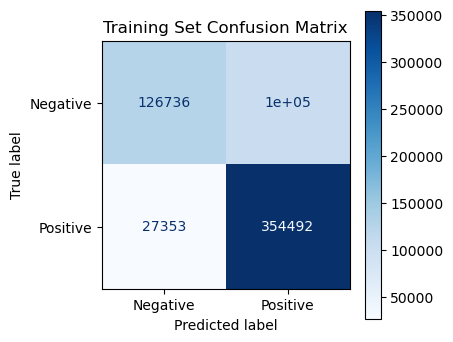

{'accuracy': 0.7879076636426002,
 'precision': 0.7762405896496,
 'recall': 0.9283662218963192,
 'f1_score': 0.84551526911009}

In [40]:
# evaluate on the training data
evaluate_model(nb_classifier, X_train_tfidf, y_train, dataset_name="Training Set")

Test Set Metrics:
  Accuracy: 0.5853
  Precision: 0.5654
  Recall: 0.9465
  F1_score: 0.7079

Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.18      0.29     34675
           1       0.57      0.95      0.71     39266

    accuracy                           0.59     73941
   macro avg       0.65      0.56      0.50     73941
weighted avg       0.65      0.59      0.51     73941



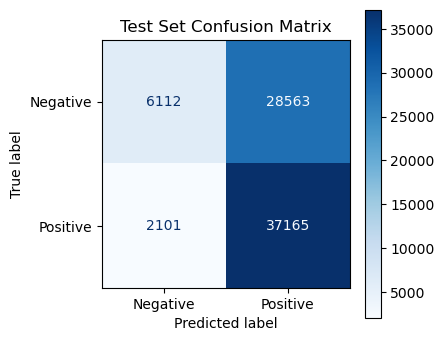

{'accuracy': 0.5852909752370133,
 'precision': 0.5654363437195715,
 'recall': 0.9464931492894616,
 'f1_score': 0.7079452159171}

In [41]:
# evaluate on the test data
evaluate_model(nb_classifier, X_test_tfidf, y_test, dataset_name="Test Set")

# 5. Hyperparameter Tuning
## 5.1. Reducing Vocabulary Length

In [35]:
def run_text_classification_pipeline(train_texts, train_labels, test_texts, test_labels, max_features=None, smoothing=1.0):
    """
    Runs the full text classification pipeline, from vectorization to model training and evaluation.

    Args:
        train_texts (pandas.Series or list of str): Training text data.
        train_labels (pandas.Series or array): Labels for the training set.
        test_texts (pandas.Series or list of str): Test text data.
        test_labels (pandas.Series or array): Labels for the test set.
        max_features (int or None, optional): Maximum vocabulary size for TF-IDF vectorizer.
        smoothing (float, optional): Smoothing parameter for Naive Bayes classifier.

    Returns:
        dict: A dictionary containing trained model, vectorizer, and evaluation metrics for both training and test sets.
    """
    # vectorize the text data
    X_train_tfidf, X_test_tfidf, tfidf_vectorizer = vectorize_text(train_texts, test_texts, max_features)

    # train the Naive Bayes classifier
    nb_classifier = train_naive_bayes(X_train_tfidf, train_labels, smoothing)

    # evaluate on training and test sets
    train_metrics = evaluate_model(nb_classifier, X_train_tfidf, train_labels, dataset_name="Training Set")
    test_metrics = evaluate_model(nb_classifier, X_test_tfidf, test_labels, dataset_name="Test Set")
    
    # return the model, vectorizer, and metrics for further inspection
    return {
        "model": nb_classifier,
        "vectorizer": tfidf_vectorizer,
        "train_metrics": train_metrics,
        "test_metrics": test_metrics
    }

### 5.1.1. Vocabulary Size = 250,000 (half size)

TF-IDF training set shape: (610767, 250000)
TF-IDF test set shape: (73941, 250000)
Training Set Metrics:
  Accuracy: 0.7912
  Precision: 0.7960
  Recall: 0.8955
  F1_score: 0.8428

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.62      0.69    228922
           1       0.80      0.90      0.84    381845

    accuracy                           0.79    610767
   macro avg       0.79      0.76      0.77    610767
weighted avg       0.79      0.79      0.79    610767



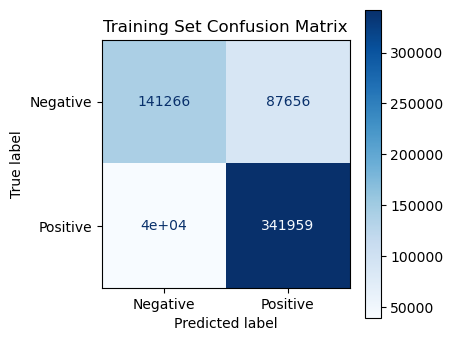

Test Set Metrics:
  Accuracy: 0.5981
  Precision: 0.5753
  Recall: 0.9288
  F1_score: 0.7105

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.22      0.34     34675
           1       0.58      0.93      0.71     39266

    accuracy                           0.60     73941
   macro avg       0.66      0.58      0.53     73941
weighted avg       0.65      0.60      0.54     73941



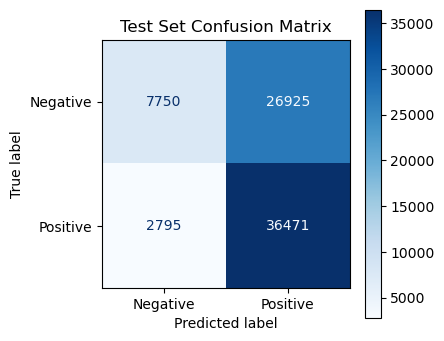

In [42]:
results = run_text_classification_pipeline(
    train_texts=X_train,
    train_labels=y_train,
    test_texts=X_test,
    test_labels=y_test,
    max_features=250000,  # around half of the full vocab
    smoothing=0.5       
)

### 5.1.2. Vocabulary Size = 100,000 (1/5 of original size)

TF-IDF training set shape: (610767, 100000)
TF-IDF test set shape: (73941, 100000)
Training Set Metrics:
  Accuracy: 0.7807
  Precision: 0.8047
  Recall: 0.8573
  F1_score: 0.8302

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.65      0.69    228922
           1       0.80      0.86      0.83    381845

    accuracy                           0.78    610767
   macro avg       0.77      0.76      0.76    610767
weighted avg       0.78      0.78      0.78    610767



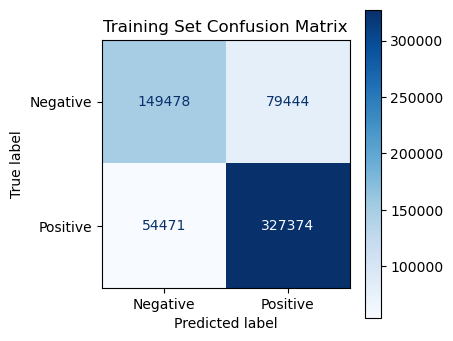

Test Set Metrics:
  Accuracy: 0.6076
  Precision: 0.5831
  Recall: 0.9159
  F1_score: 0.7126

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.26      0.38     34675
           1       0.58      0.92      0.71     39266

    accuracy                           0.61     73941
   macro avg       0.66      0.59      0.55     73941
weighted avg       0.65      0.61      0.56     73941



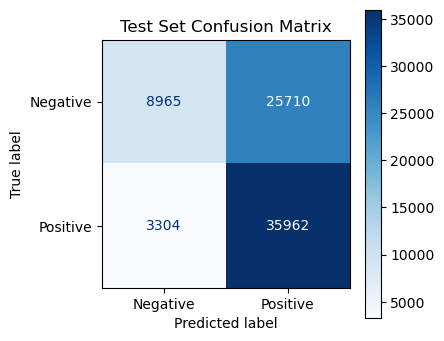

In [ ]:
results = run_text_classification_pipeline(
    train_texts=X_train,
    train_labels=y_train,
    test_texts=X_test,
    test_labels=y_test,
    max_features=100000,  # around 1/5 of the full vocab
    smoothing=0.5       
)

### 5.1.3. Vocabulary Size = 50,000 

TF-IDF training set shape: (610767, 10000)
TF-IDF test set shape: (73941, 10000)
Training Set Metrics:
  Accuracy: 0.7162
  Precision: 0.7631
  Recall: 0.7919
  F1_score: 0.7772

Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.59      0.61    228922
           1       0.76      0.79      0.78    381845

    accuracy                           0.72    610767
   macro avg       0.70      0.69      0.69    610767
weighted avg       0.71      0.72      0.71    610767



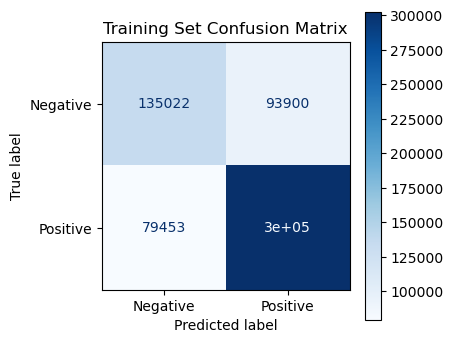

Test Set Metrics:
  Accuracy: 0.5924
  Precision: 0.5698
  Recall: 0.9489
  F1_score: 0.7120

Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.19      0.30     34675
           1       0.57      0.95      0.71     39266

    accuracy                           0.59     73941
   macro avg       0.67      0.57      0.51     73941
weighted avg       0.66      0.59      0.52     73941



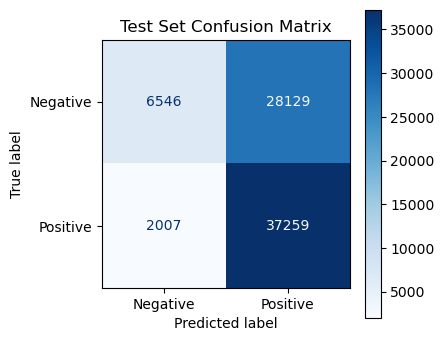

In [45]:
results = run_text_classification_pipeline(
    train_texts=X_train,
    train_labels=y_train,
    test_texts=X_test,
    test_labels=y_test,
    max_features=10000,  
    smoothing=0.5       
)

## 5.2. Tweaking Smoothing Factor
### 5.2.1. Smoothing Factor of 0.7

In [36]:
results = run_text_classification_pipeline(
    train_texts=X_train,
    train_labels=y_train,
    test_texts=X_test,
    test_labels=y_test,
    max_features=10000,  # vocab size
    smoothing=0.7       
)

### 5.2.2. Smoothing Factor of 1

TF-IDF training set shape: (610767, 10000)
TF-IDF test set shape: (73941, 10000)
Training Set Metrics:
  Accuracy: 0.7163
  Precision: 0.7629
  Recall: 0.7925
  F1_score: 0.7774

Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.59      0.61    228922
           1       0.76      0.79      0.78    381845

    accuracy                           0.72    610767
   macro avg       0.70      0.69      0.69    610767
weighted avg       0.71      0.72      0.71    610767



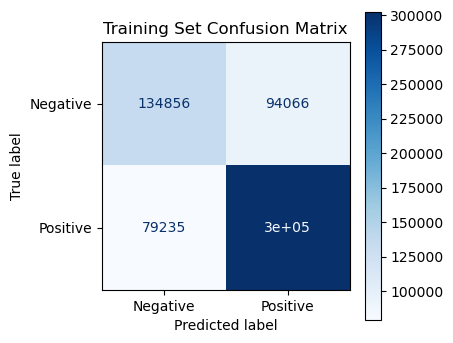

Test Set Metrics:
  Accuracy: 0.5922
  Precision: 0.5697
  Recall: 0.9490
  F1_score: 0.7120

Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.19      0.30     34675
           1       0.57      0.95      0.71     39266

    accuracy                           0.59     73941
   macro avg       0.67      0.57      0.51     73941
weighted avg       0.66      0.59      0.52     73941



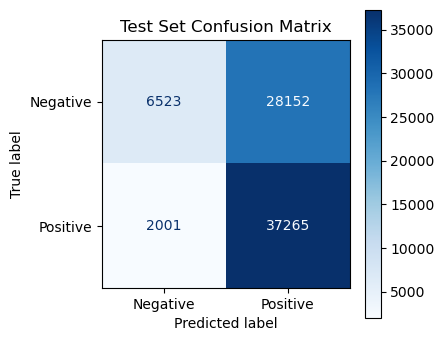

In [37]:
results = run_text_classification_pipeline(
    train_texts=X_train,
    train_labels=y_train,
    test_texts=X_test,
    test_labels=y_test,
    max_features=10000,  # vocab size
    smoothing=1       
)

## 5.3. Observations

The test set's accuracy plateaus at around 0.6 regardeless of the hyperparameters that have been tried.

We can notice that the recall is high but the precision poor: there are a lot of false positives.

After checking the training data distribution (see section 1.3.5.), we see that the training set is unbalanced; the model is biased toward predicting the majority class. 

Hypothesis: the precision should improve after data balancing.

# 6. Data Balancing (Random Downsampling)

In [38]:
def downsample_majority_class(data, label_column='label', random_state=42):
    """
    Balances the dataset by performing random downsampling on the majority class.

    Args:
        data (pd.DataFrame): The input dataset containing text and label columns.
        label_column (str): The name of the column containing the class labels. 
                            The majority class will be downsampled to match the minority class size.
        random_state (int): Seed for reproducibility of the downsampling process.

    Returns:
        pd.DataFrame: A balanced dataset with the majority class downsampled to the size of the minority class.
    """
    # separate majority and minority classes
    majority_class = data[data[label_column] == 1]
    minority_class = data[data[label_column] == 0]
    
    # downsample majority class to match minority class size
    majority_downsampled = resample(
        majority_class, 
        replace=False,  # sample without replacement
        n_samples=len(minority_class),  # set majority size equal to minority class size
        random_state=random_state  # ensure reproducibility
    )
    
    # combine minority class with downsampled majority class
    balanced_data = pd.concat([minority_class, majority_downsampled])
    
    # shuffle the combined dataset
    balanced_data = balanced_data.sample(frac=1, random_state=random_state).reset_index(drop=True)
    
    return balanced_data


In [41]:
# balance train_df
balanced_train_df = downsample_majority_class(train_df, label_column='label')

# separate the features and labels after downsampling
X_train_balanced = balanced_train_df['cleaned_text']
y_train_balanced = balanced_train_df['label']

# 7. Results after Data Balancing
## 7.1. Full Vocabulary

TF-IDF training set shape: (457844, 462518)
TF-IDF test set shape: (73941, 462518)
Training Set Metrics:
  Accuracy: 0.7757
  Precision: 0.7969
  Recall: 0.7398
  F1_score: 0.7673

Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.81      0.78    228922
           1       0.80      0.74      0.77    228922

    accuracy                           0.78    457844
   macro avg       0.78      0.78      0.78    457844
weighted avg       0.78      0.78      0.78    457844



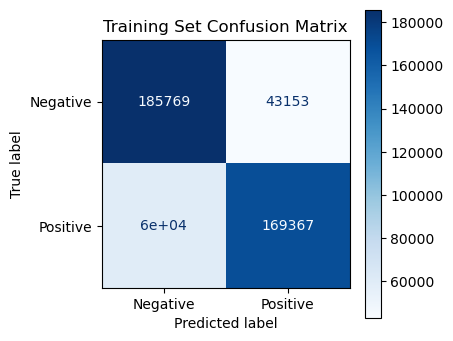

Test Set Metrics:
  Accuracy: 0.6405
  Precision: 0.6152
  Recall: 0.8625
  F1_score: 0.7181

Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.39      0.50     34675
           1       0.62      0.86      0.72     39266

    accuracy                           0.64     73941
   macro avg       0.66      0.63      0.61     73941
weighted avg       0.66      0.64      0.62     73941



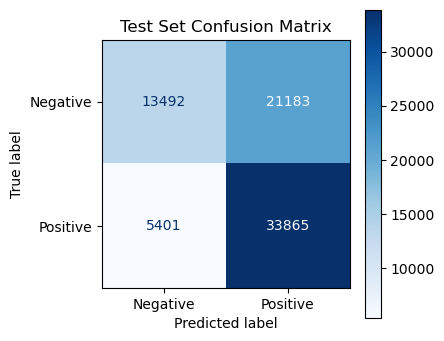

In [43]:
results = run_text_classification_pipeline(
    train_texts=X_train_balanced,
    train_labels=y_train_balanced,
    test_texts=X_test,
    test_labels=y_test,
    max_features=None, 
    smoothing=0.5       
)

**Remarks:** 
* the precision increased from 0.57 (baseline) after data balancing to 0.61
* the number of false positives decreased from 28k to 21k
* test accuracy increased from 0.58 to 0.64

In [46]:
# access the vectorizer from the results
tfidf_vectorizer_bal = results["vectorizer"]

# get the size of the vocabulary
vocab_size_bal = len(tfidf_vectorizer_bal.vocabulary_)
print(f"vocabulary size: {vocab_size_bal}")

vocabulary size: 462518


## 7.2. Vocabulary Size = 50,000

TF-IDF training set shape: (457844, 50000)
TF-IDF test set shape: (73941, 50000)
Training Set Metrics:
  Accuracy: 0.7393
  Precision: 0.7843
  Recall: 0.6601
  F1_score: 0.7169

Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.82      0.76    228922
           1       0.78      0.66      0.72    228922

    accuracy                           0.74    457844
   macro avg       0.75      0.74      0.74    457844
weighted avg       0.75      0.74      0.74    457844



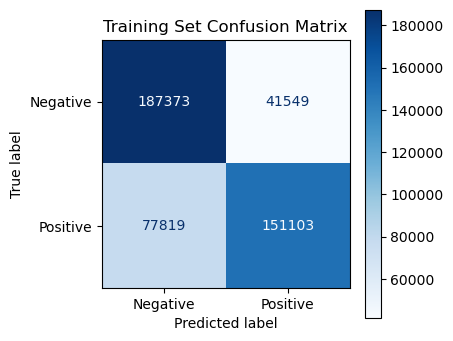

Test Set Metrics:
  Accuracy: 0.6488
  Precision: 0.6238
  Recall: 0.8529
  F1_score: 0.7206

Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.42      0.53     34675
           1       0.62      0.85      0.72     39266

    accuracy                           0.65     73941
   macro avg       0.67      0.64      0.62     73941
weighted avg       0.67      0.65      0.63     73941



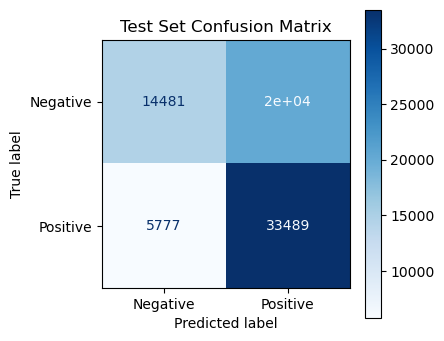

In [48]:
results_bal_voc250k = run_text_classification_pipeline(
    train_texts=X_train_balanced,
    train_labels=y_train_balanced,
    test_texts=X_test,
    test_labels=y_test,
    max_features=50000, 
    smoothing=0.5       
)

Test accuracy around 0.65 and F1-score around 0.72.

# 8. Macro and Micro F1 Scores
Compute both macro and micro F1 scores based on a given confusion matrix.


In [1]:
def compute_f1_scores(confusion_matrix):
    """
    Compute macro and micro F1 scores from a confusion matrix.
    
    Args:
        confusion_matrix (numpy.ndarray): A K x K matrix where K is the number of classes. 
            Entry [i, j] represents the number of instances of class i predicted as class j.
    
    Returns:
        tuple: A tuple containing:
            - macro_f1 (float): The average F1 score across all classes.
            - micro_f1 (float): The F1 score computed using overall precision and recall.
    """
    # number of classes
    num_classes = confusion_matrix.shape[0]
    
    # initialize variables for micro metrics
    tp_micro = 0
    fp_micro = 0
    fn_micro = 0
    
    f1_scores = []
    
    # compute per-class metrics
    for k in range(num_classes):
        tp = confusion_matrix[k, k]  # true positives for class k
        fp = np.sum(confusion_matrix[:, k]) - tp  # false positives for class k
        fn = np.sum(confusion_matrix[k, :]) - tp  # false negatives for class k
        
        # update micro metrics
        tp_micro += tp
        fp_micro += fp
        fn_micro += fn
        
        # compute precision, recall, and F1 for class k
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1 = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
        
        f1_scores.append(f1)
    
    # macro F1 score
    macro_f1 = np.mean(f1_scores)
    
    # compute micro precision and recall
    precision_micro = tp_micro / (tp_micro + fp_micro) if (tp_micro + fp_micro) > 0 else 0
    recall_micro = tp_micro / (tp_micro + fn_micro) if (tp_micro + fn_micro) > 0 else 0
    
    # micro F1 score
    micro_f1 = (2 * precision_micro * recall_micro) / (precision_micro + recall_micro) if (precision_micro + recall_micro) > 0 else 0
    
    return macro_f1, micro_f1


In [7]:
# best test set results with vocab size = 50,000 (see previous section): 
test_size = len(test_df)
TN = 14481
TP = 33489
FN = 5777
FP = test_size - (TN + TP + FN)

print(FP)

20194


In [10]:
cm = np.array([
    [14481, 20194],  # row for actual negatives: TN and FP
    [5777, 33489]    # row for actual positives: FN and TP
])

In [12]:
macro_f1, micro_f1 = compute_f1_scores(cm)
print(f"macro F1: {macro_f1}")
print(f"micro F1: {micro_f1}")

macro F1: 0.6239063914496578
micro F1: 0.6487604982350793
